### All parameters - longer experiment (15000 samples)

Include the analysis script and setup the folders with raw data

In [1]:
from benchmarking.analysis.analyze_results import *

In [2]:
output_base_folder = Path("/iarai/home/ivan.svogor/storage-benchmarking-raw/referenced-experiments")
s3_folder_filter="1711-long/s3/*benchmark_e2e*"
scratch_folder_filter="1711-long/scratch/*benchmark_e2e*"

#### Load raw data

In [3]:
# Load the GPU utilization 
df_gpuutil_s3 = extract_gpuutil(output_base_folder, folder_filter=s3_folder_filter)
df_gpuutil_scratch = extract_gpuutil(output_base_folder, folder_filter=scratch_folder_filter)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 216/216 [00:00<00:00, 3603.14it/s]


In [4]:
df_dataloader_s3 = extract_timelines(output_base_folder, folder_filter=s3_folder_filter)
df_dataloader_scratch = extract_timelines(output_base_folder, folder_filter=scratch_folder_filter)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 216/216 [00:01<00:00, 202.89it/s]


### Timeline plots 

Each line corresponds to a unique function call. 

timestamp False


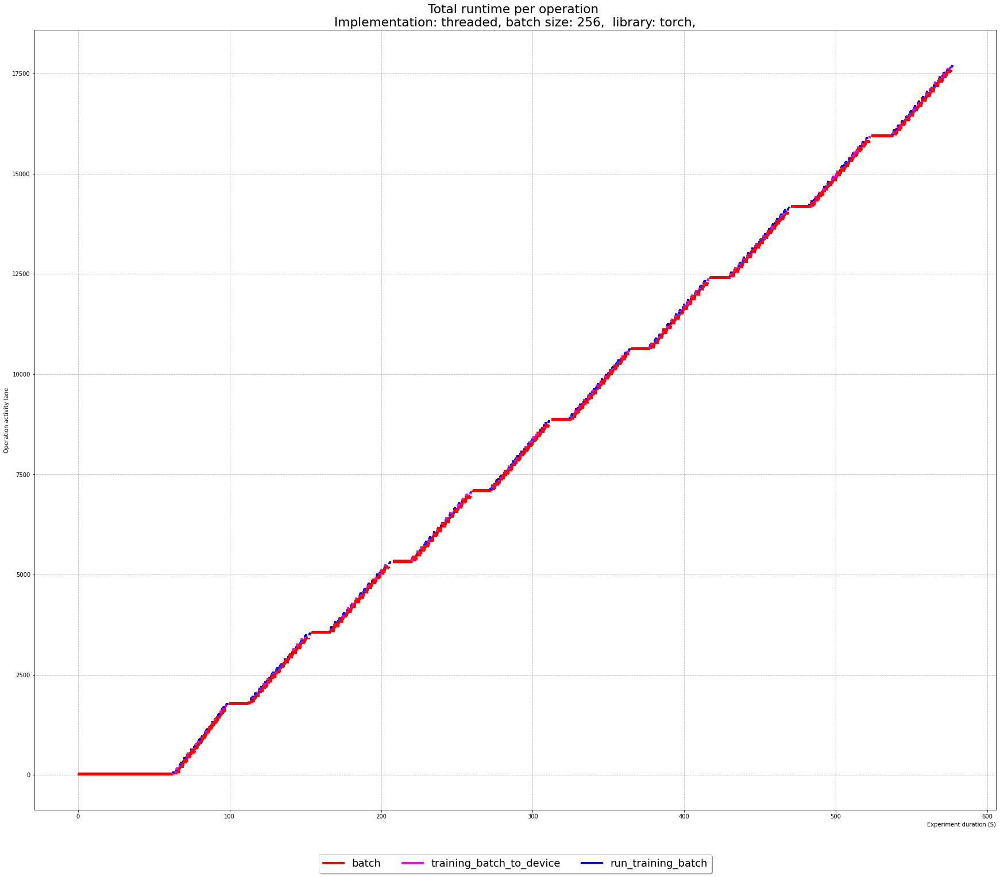

timestamp False


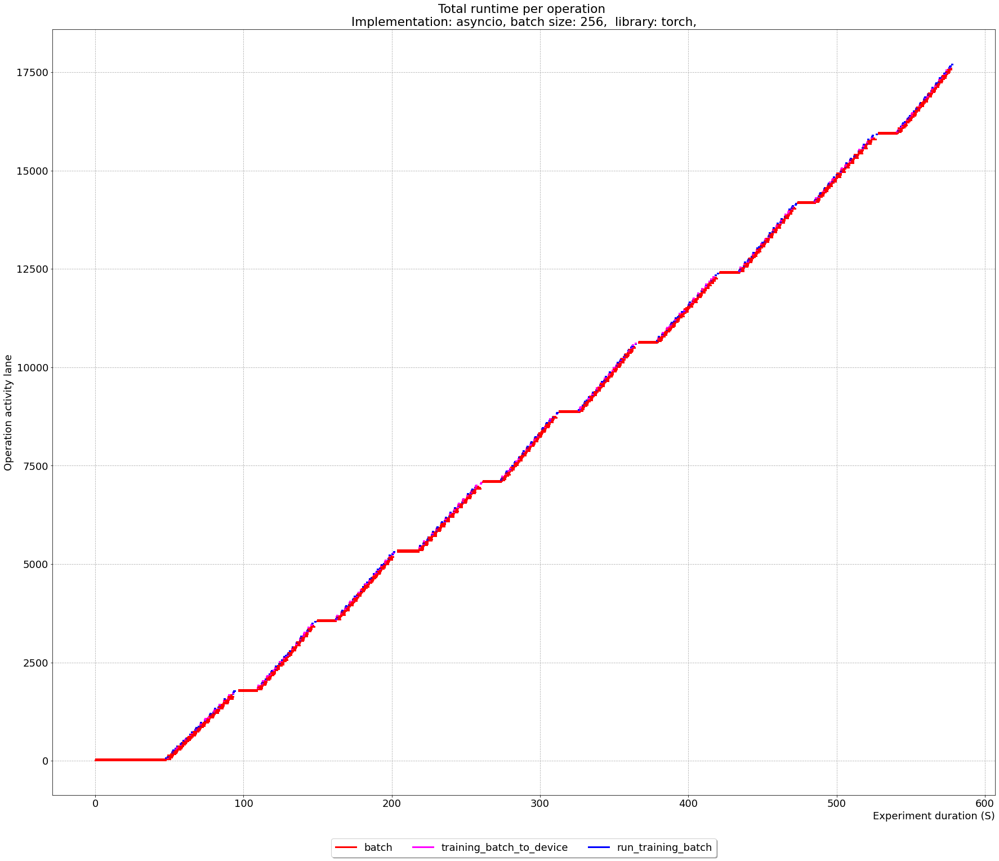

timestamp False


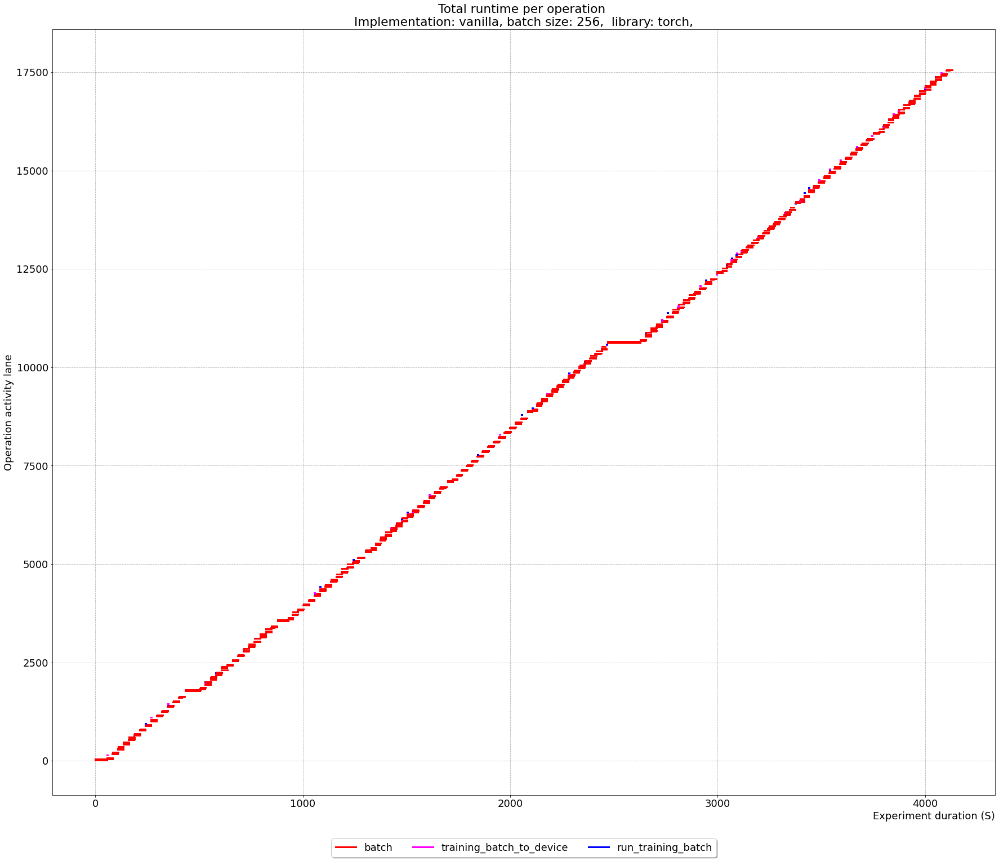

timestamp False


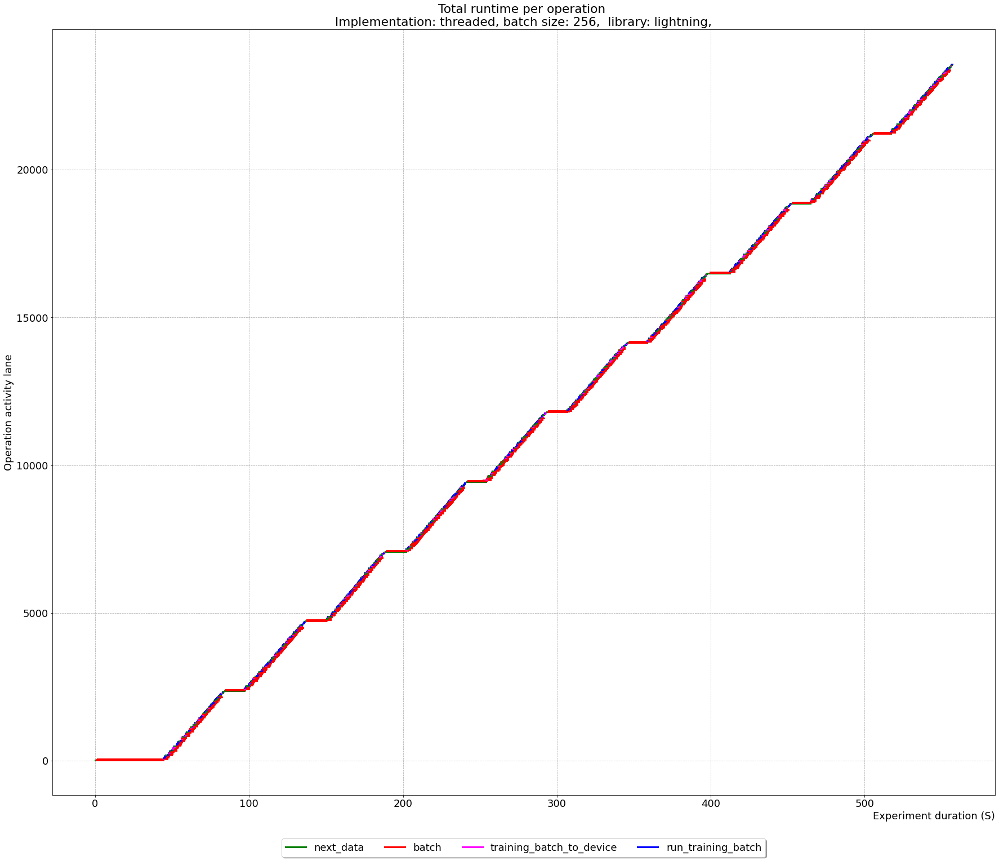

timestamp False


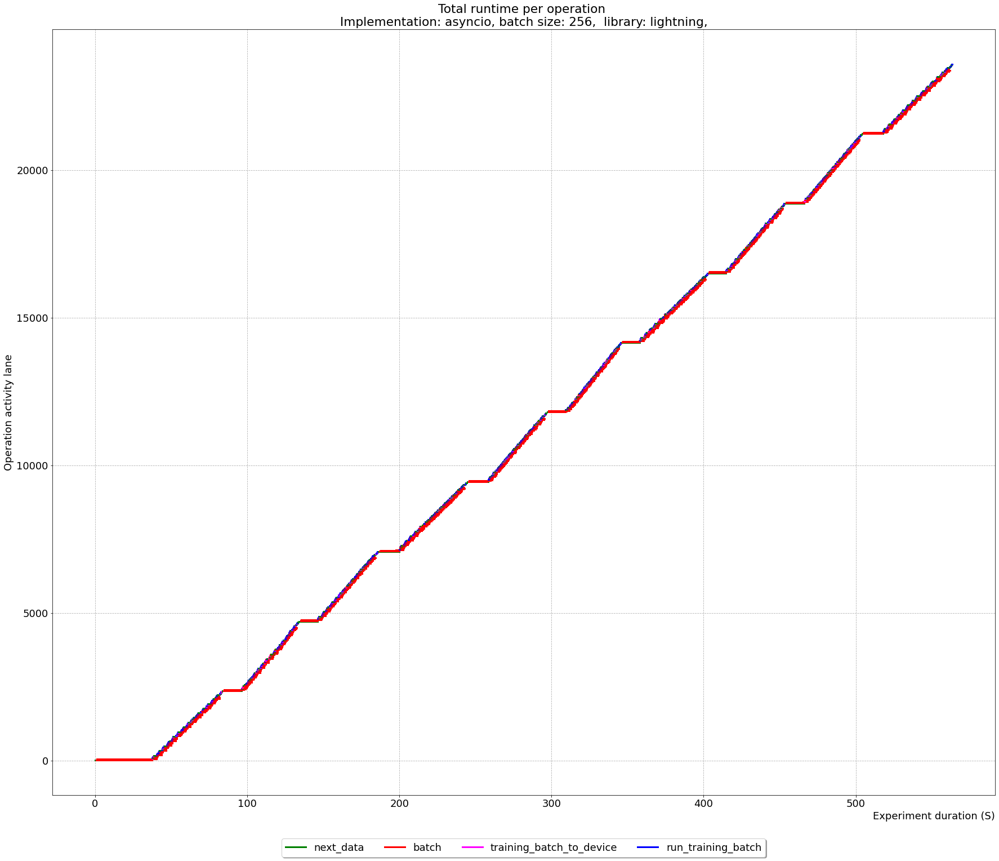

timestamp False


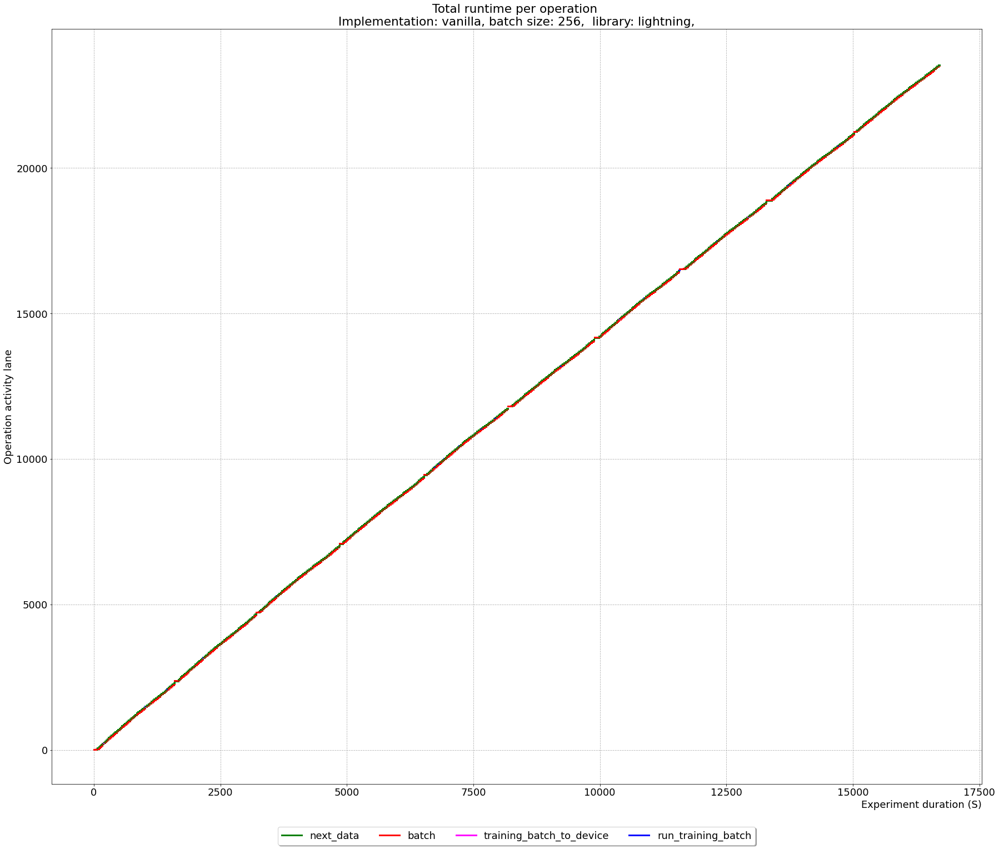

In [5]:
unique_runs_s3, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_s3)

for implementation in ["torch", "lightning"]:
    for run in sorted(unique_runs_s3):
        if implementation in run:
            df = df_dataloader_s3[df_dataloader_s3["run"]==run]
            dfgpu = df_gpuutil_s3[df_gpuutil_s3["run"]==run]
            df = df.drop_duplicates(subset="id", keep="first", inplace=False) 
            show_timelines_with_gpu(df, dfgpu, lanes, colors, run, False, False, False, 2)

timestamp False


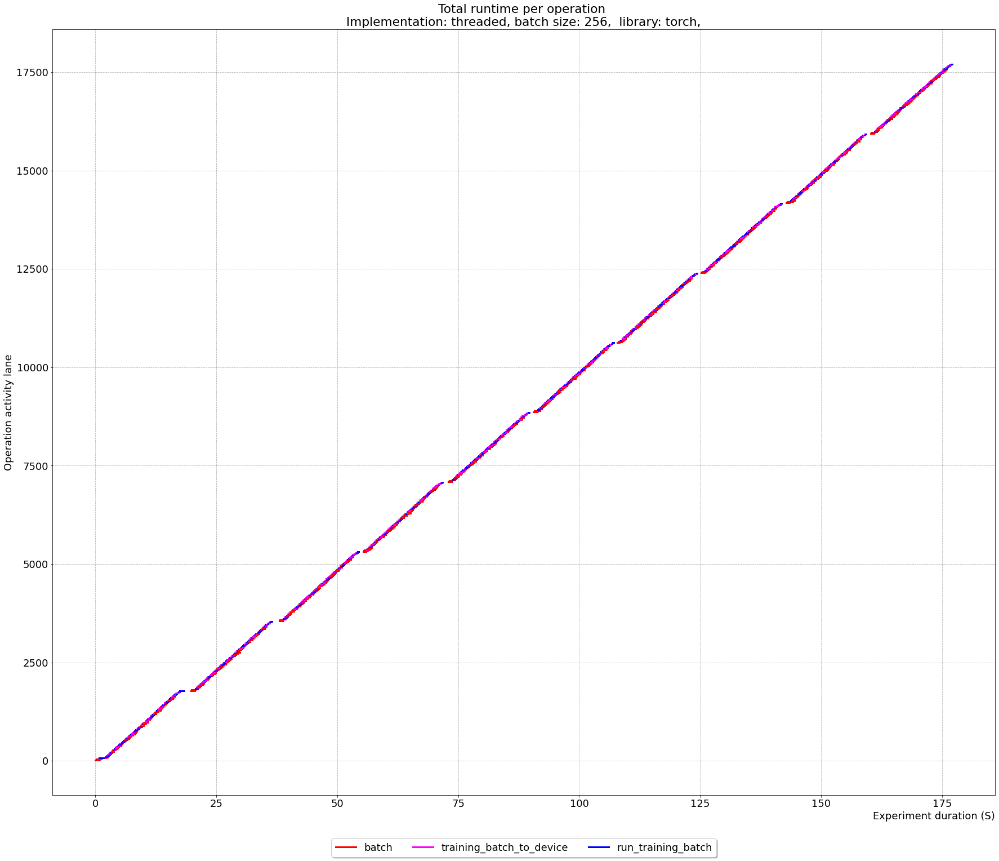

timestamp False


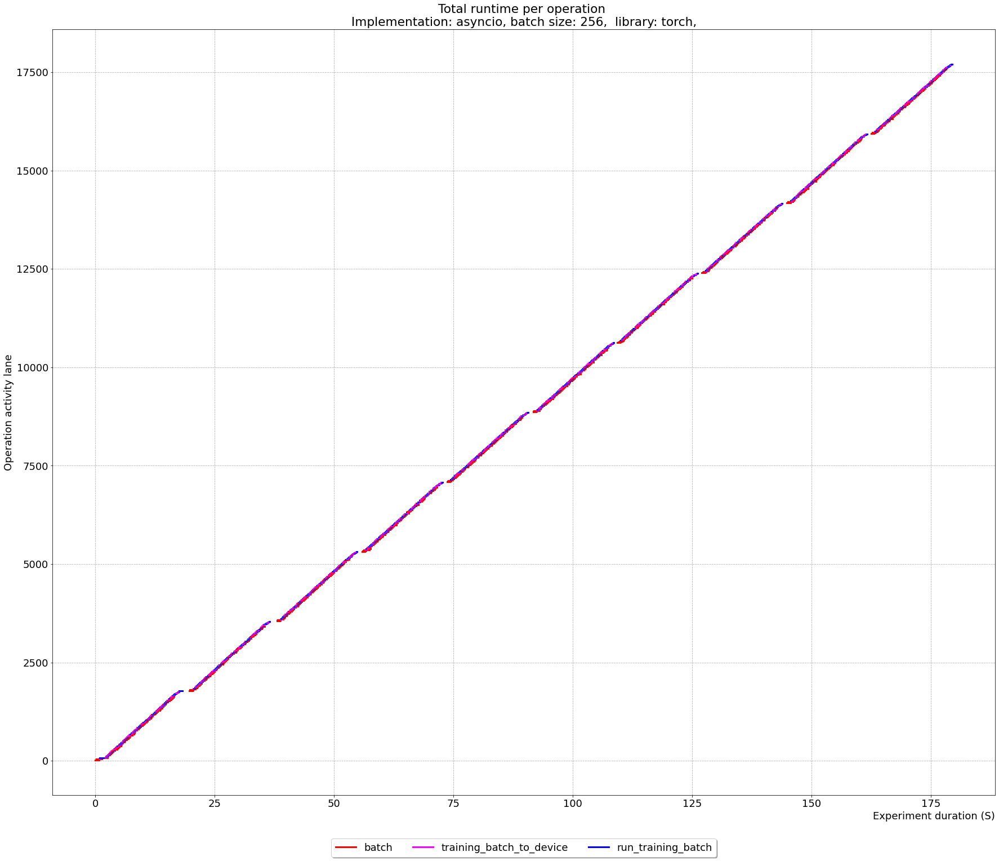

timestamp False


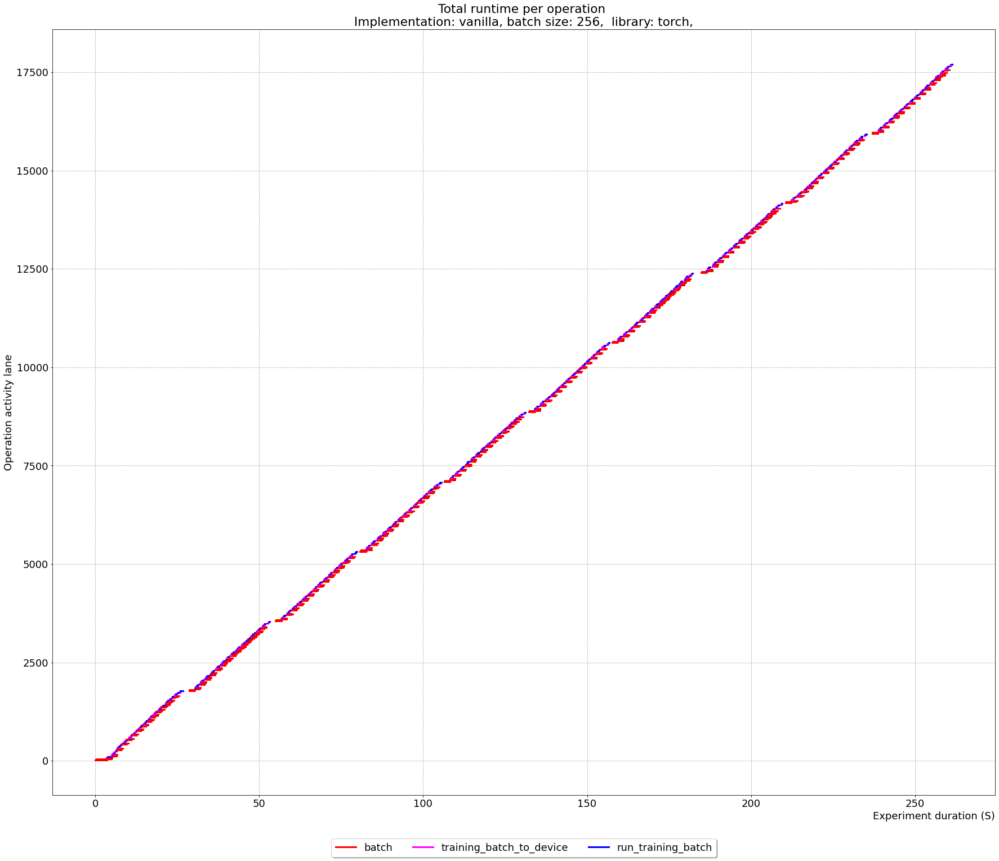

timestamp False


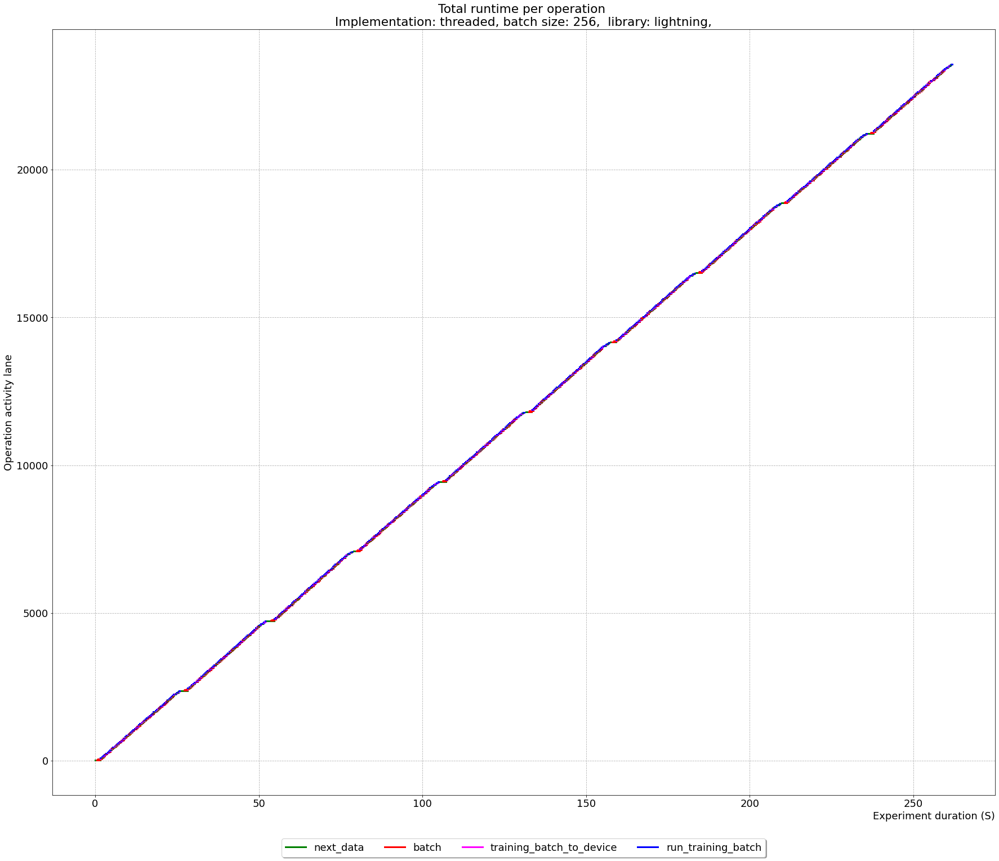

timestamp False


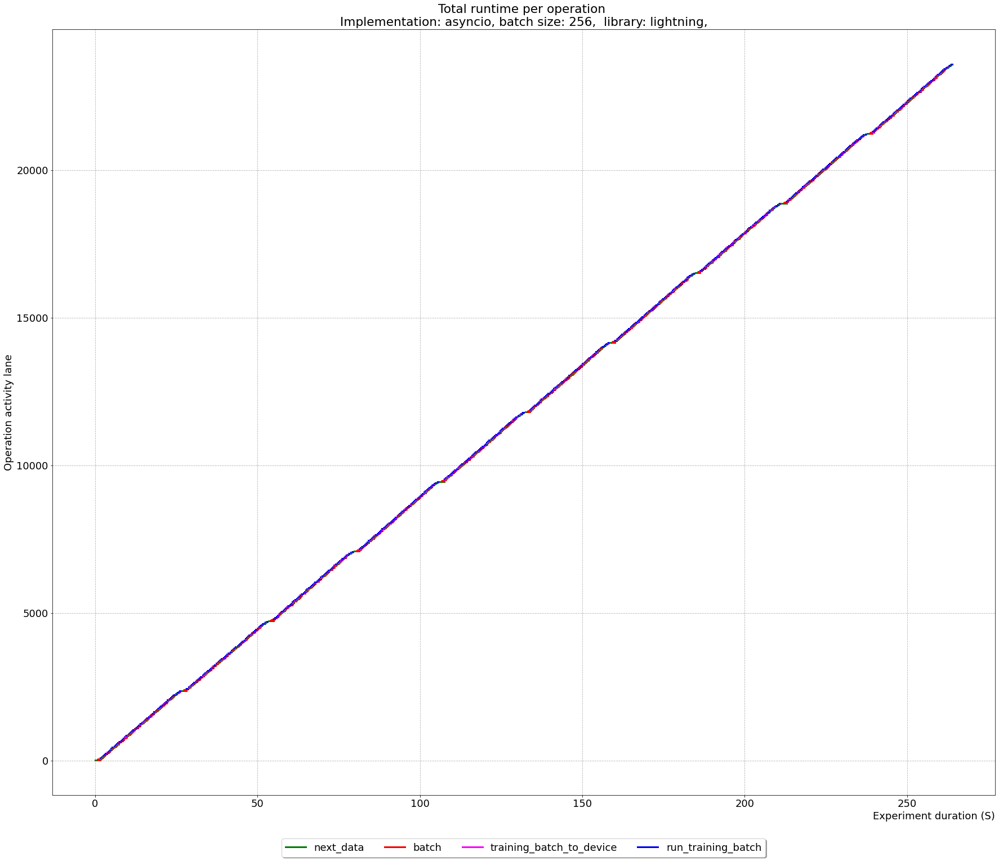

timestamp False


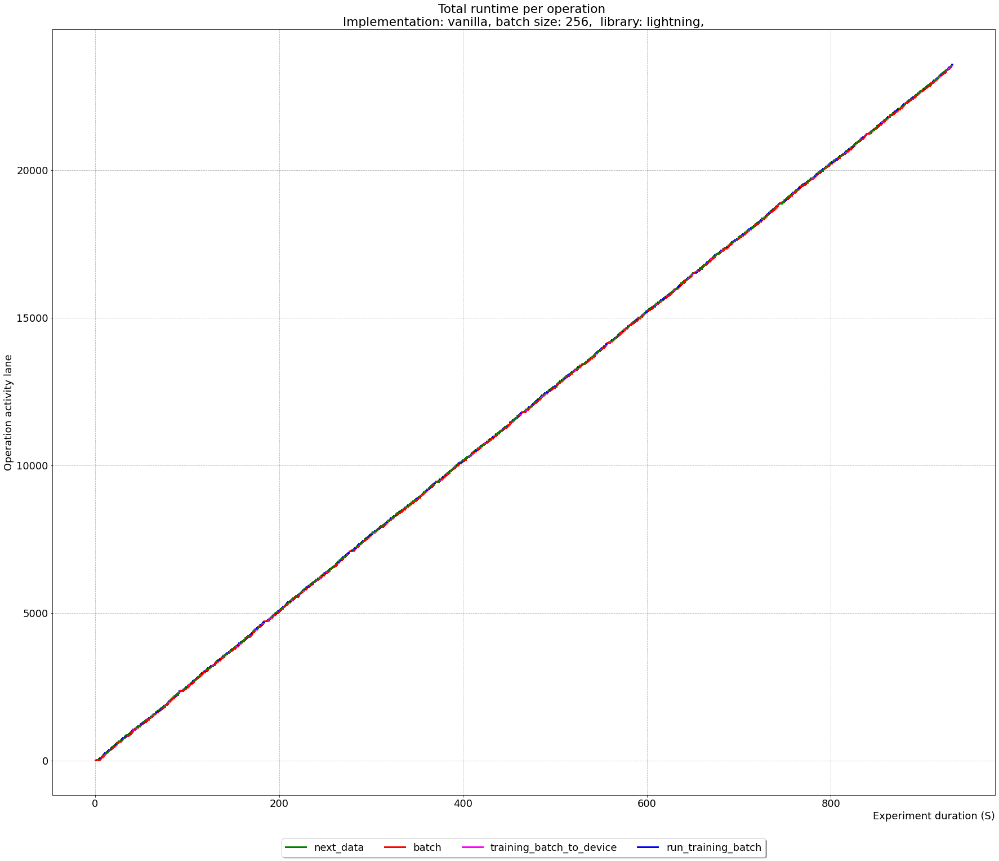

In [6]:
unique_runs_scratch, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_scratch)

for implementation in ["torch", "lightning"]:
    for run in sorted(unique_runs_scratch):
        if implementation in run:
            df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
            dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
            df = df.drop_duplicates(subset="id", keep="first", inplace=False)
            show_timelines_with_gpu(df, dfgpu, lanes, colors, run, False, False, False, 2)

### GPU utilization

In [7]:
print(unique_runs_s3, unique_runs_scratch)

['20211119f214426_benchmark_e2e_torch_s3_256_4_16_1_threaded_sync'
 '20211119f215652_benchmark_e2e_lightning_s3_256_4_16_1_threaded_sync'
 '20211119f221700_benchmark_e2e_torch_s3_256_4_16_1_asyncio_sync'
 '20211119f222840_benchmark_e2e_lightning_s3_256_4_16_1_asyncio_sync'
 '20211119f224727_benchmark_e2e_torch_s3_256_4_16_1_vanilla_sync'
 '20211119f235942_benchmark_e2e_lightning_s3_256_4_16_1_vanilla_sync'] ['20211119f220733_benchmark_e2e_torch_scratch_256_4_16_1_threaded_sync'
 '20211119f221131_benchmark_e2e_lightning_scratch_256_4_16_1_threaded_sync'
 '20211119f223831_benchmark_e2e_torch_scratch_256_4_16_1_asyncio_sync'
 '20211119f224230_benchmark_e2e_lightning_scratch_256_4_16_1_asyncio_sync'
 '20211120f044034_benchmark_e2e_torch_scratch_256_4_16_1_vanilla_sync'
 '20211120f044650_benchmark_e2e_lightning_scratch_256_4_16_1_vanilla_sync']


timestamp False


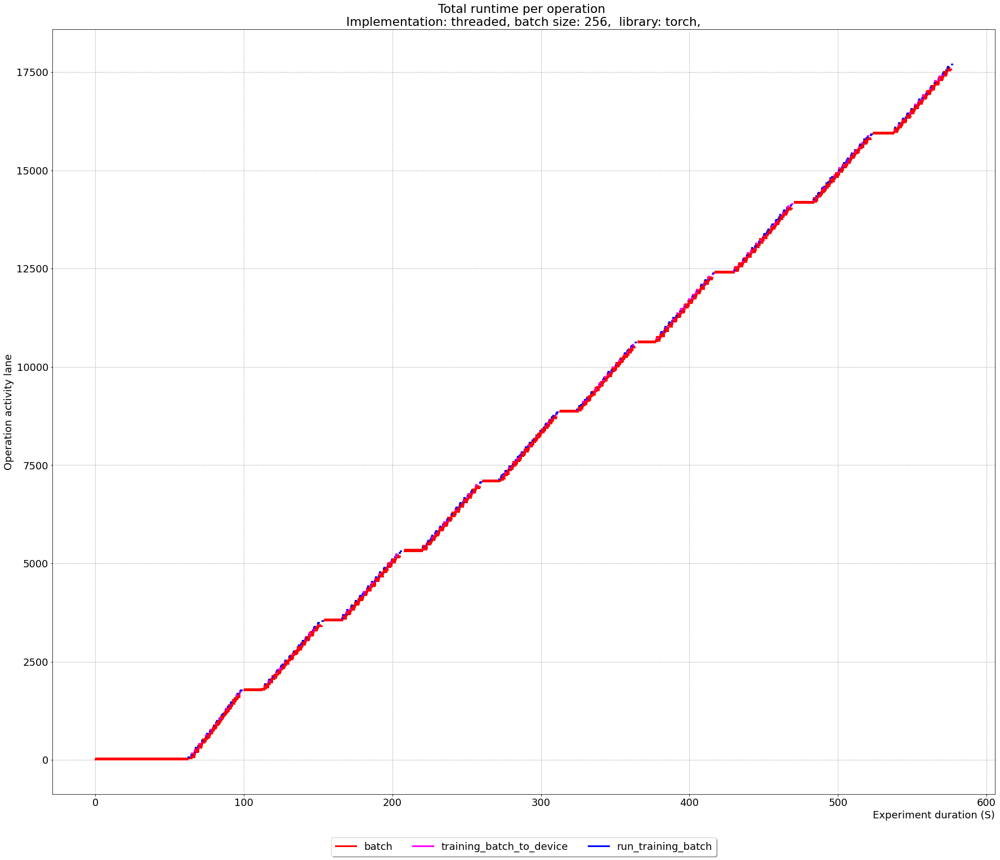

timestamp False


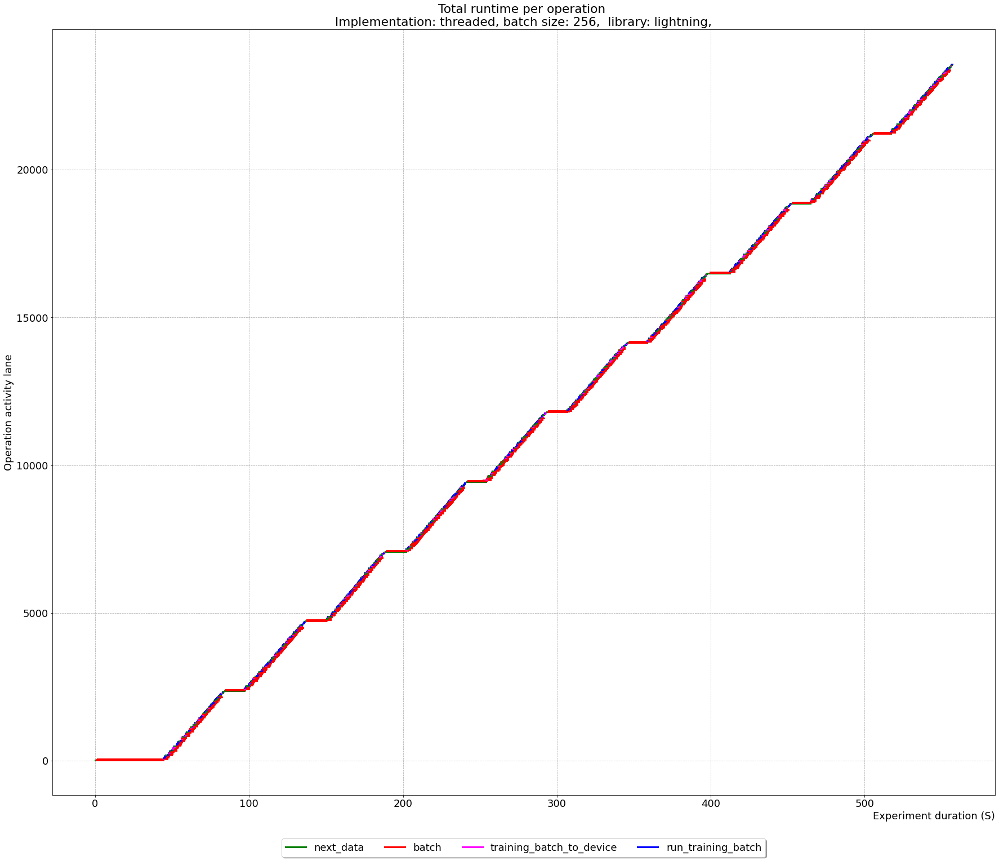

timestamp False


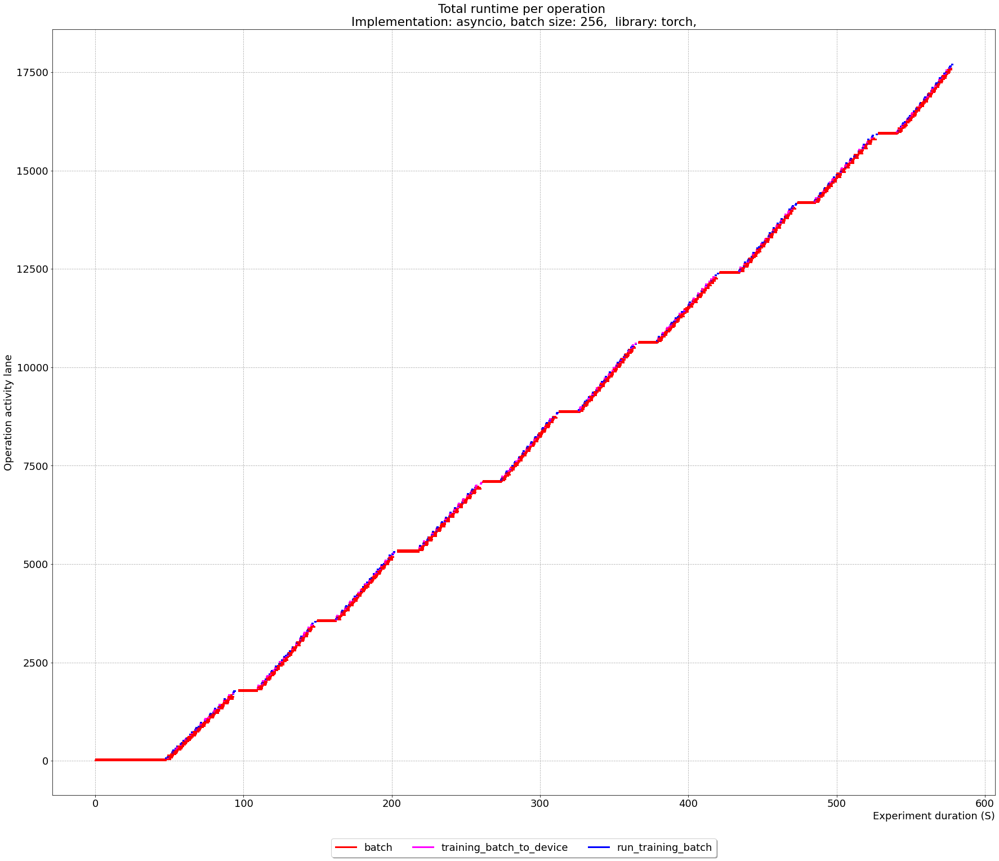

timestamp False


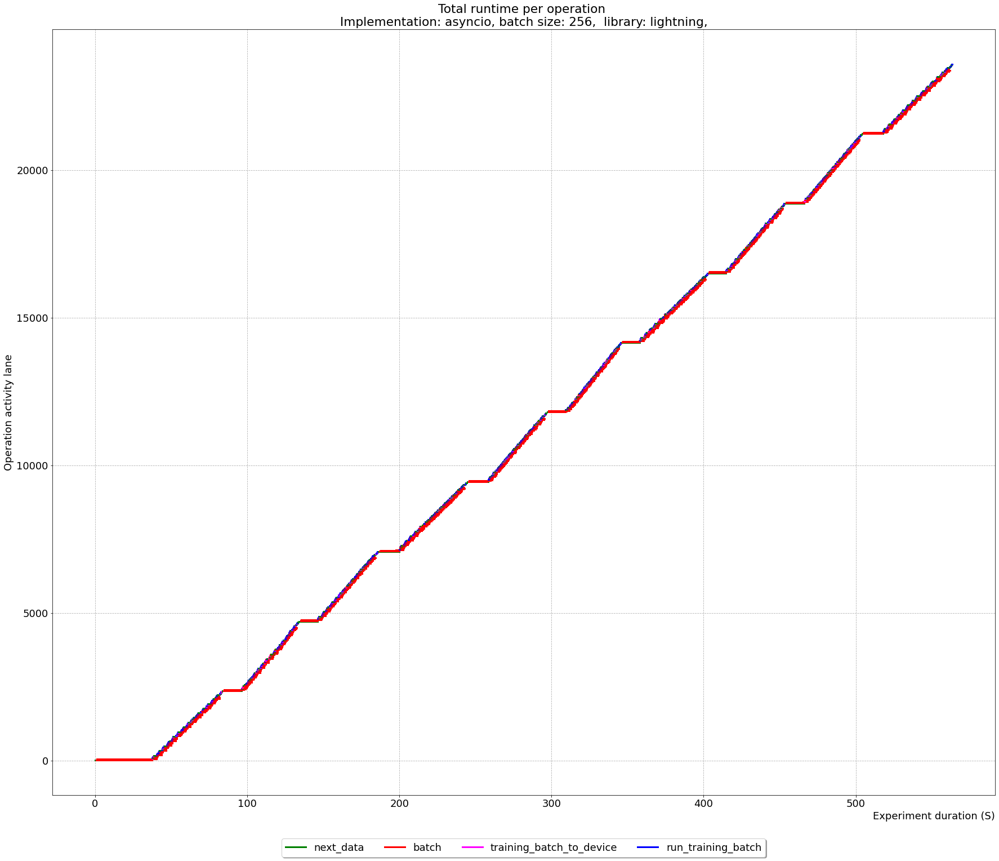

timestamp False


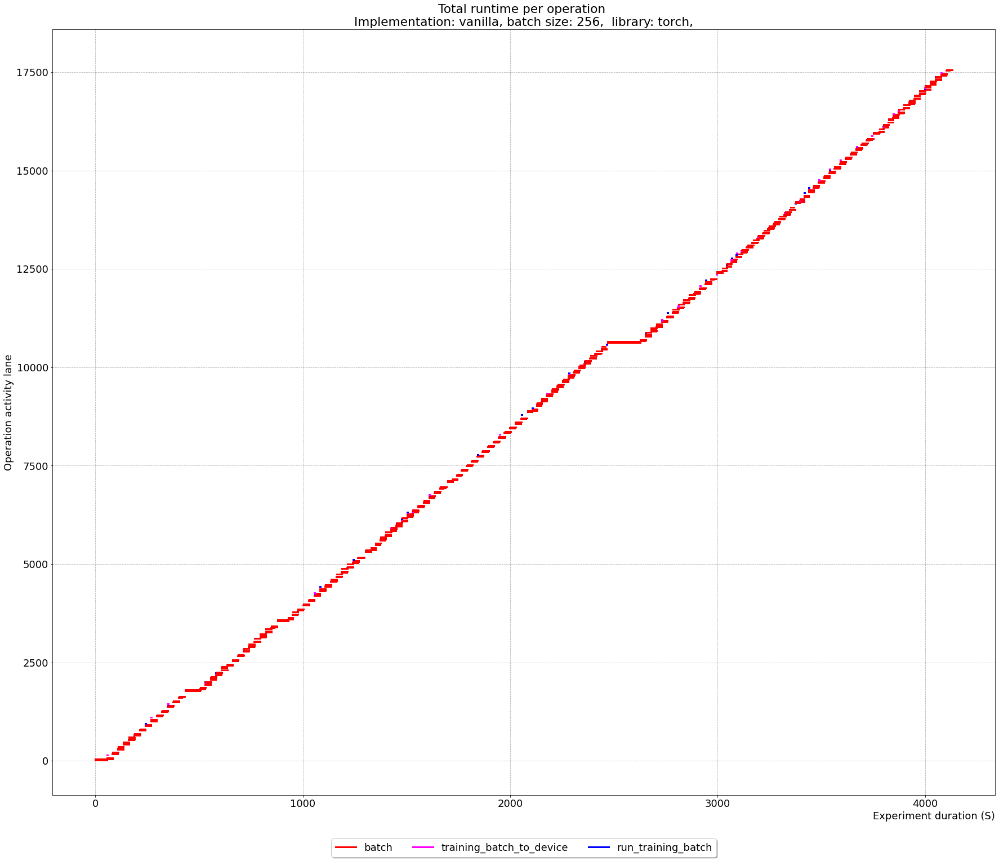

timestamp False


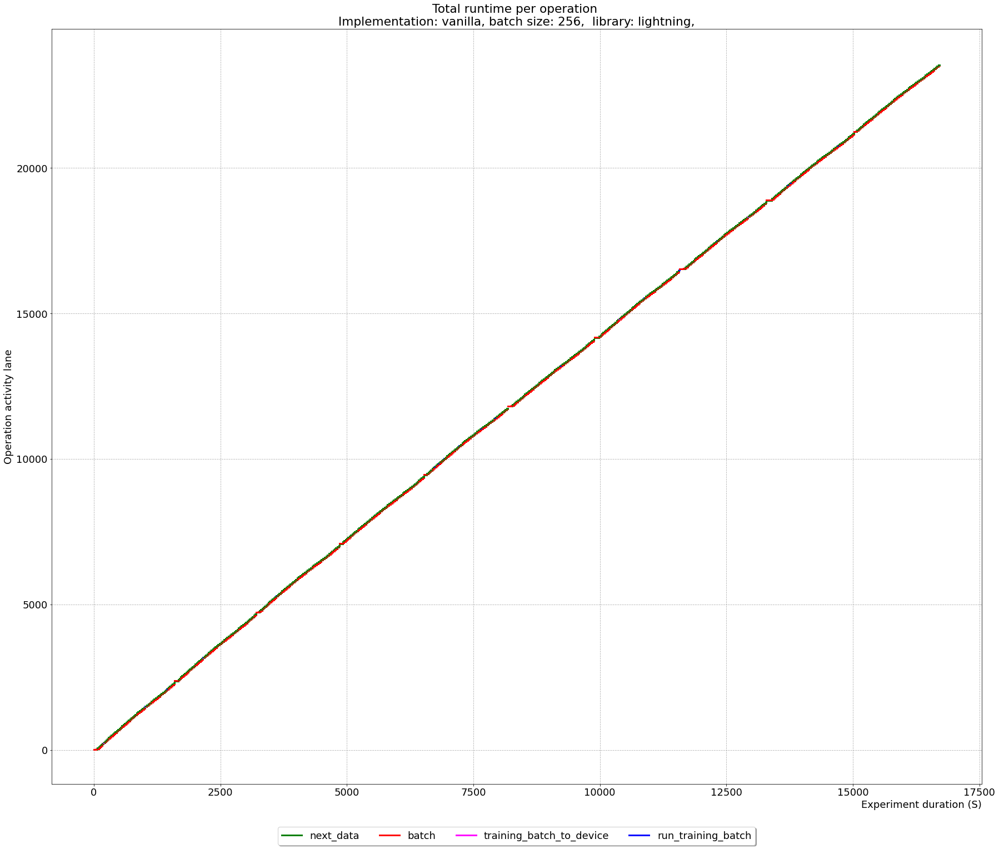

In [8]:
returns_s3 = []

for run in sorted(unique_runs_s3):
    df = df_dataloader_s3[df_dataloader_s3["run"]==run]
    dfgpu = df_gpuutil_s3[df_gpuutil_s3["run"]==run]
    df = df.drop_duplicates(subset="id", keep="first", inplace=False) 
    result = show_timelines_with_gpu(df, dfgpu, lanes, colors, run, False, False, False, 2)
    result["run"]=run
    returns_s3.append(result)

timestamp False
78.98814229249012 47.192


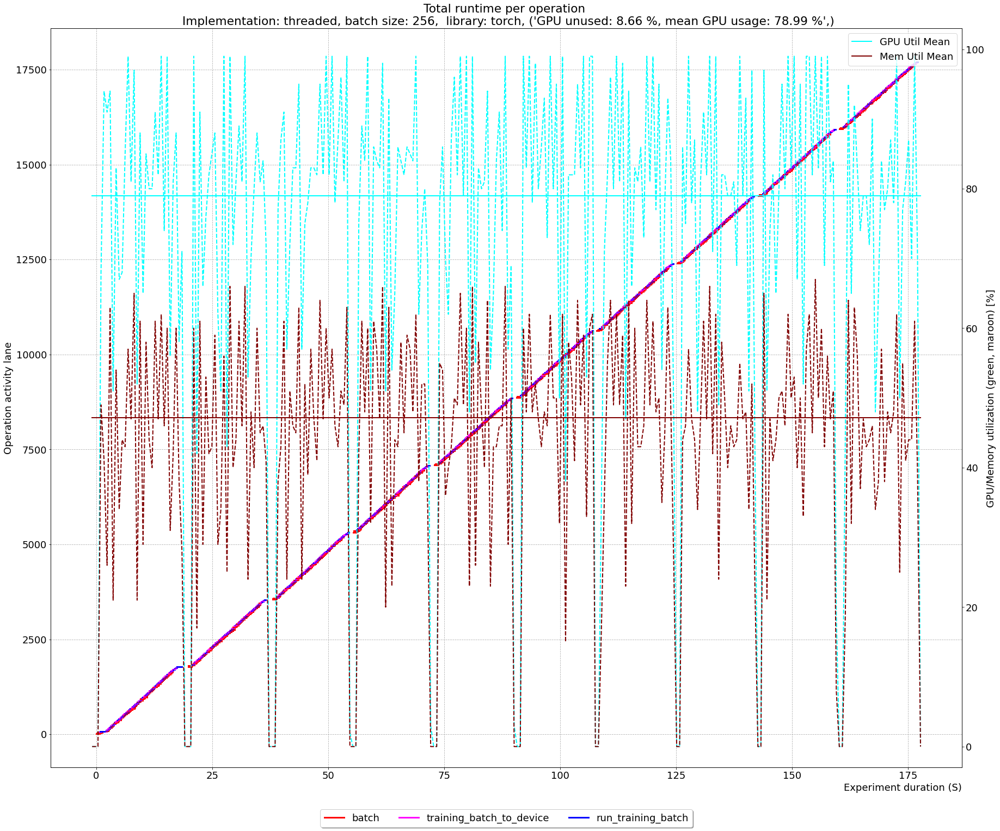

timestamp False
71.07291666666667 25.590027700831026


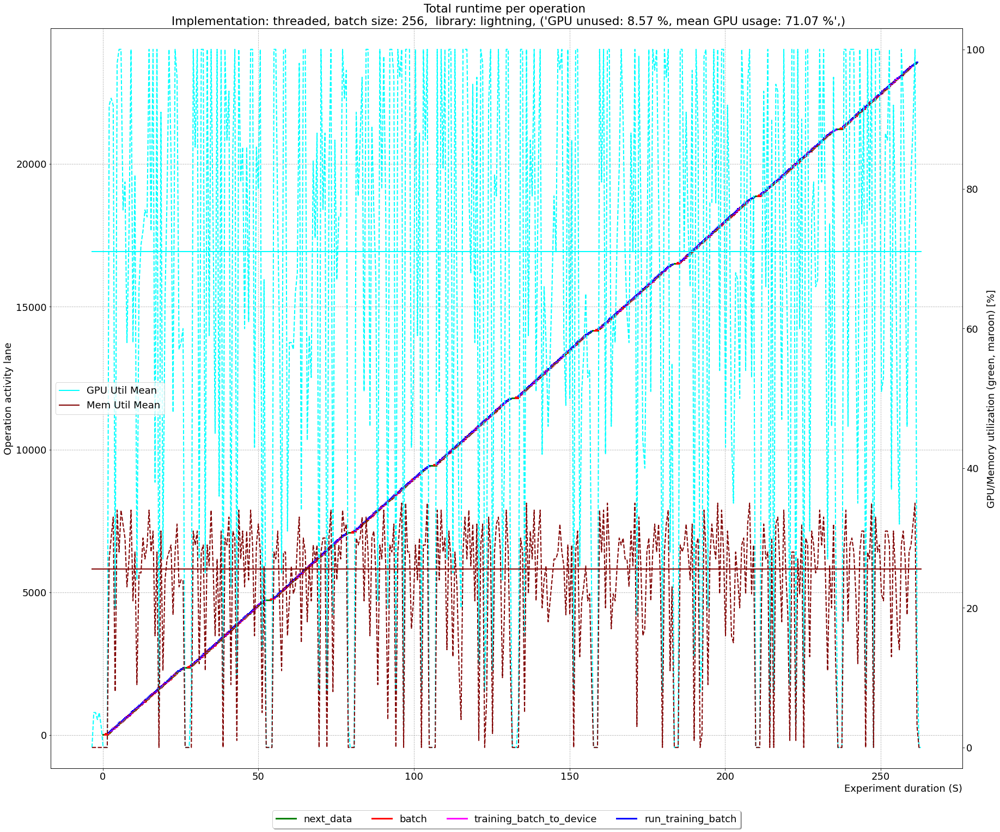

timestamp False
76.85714285714286 45.456


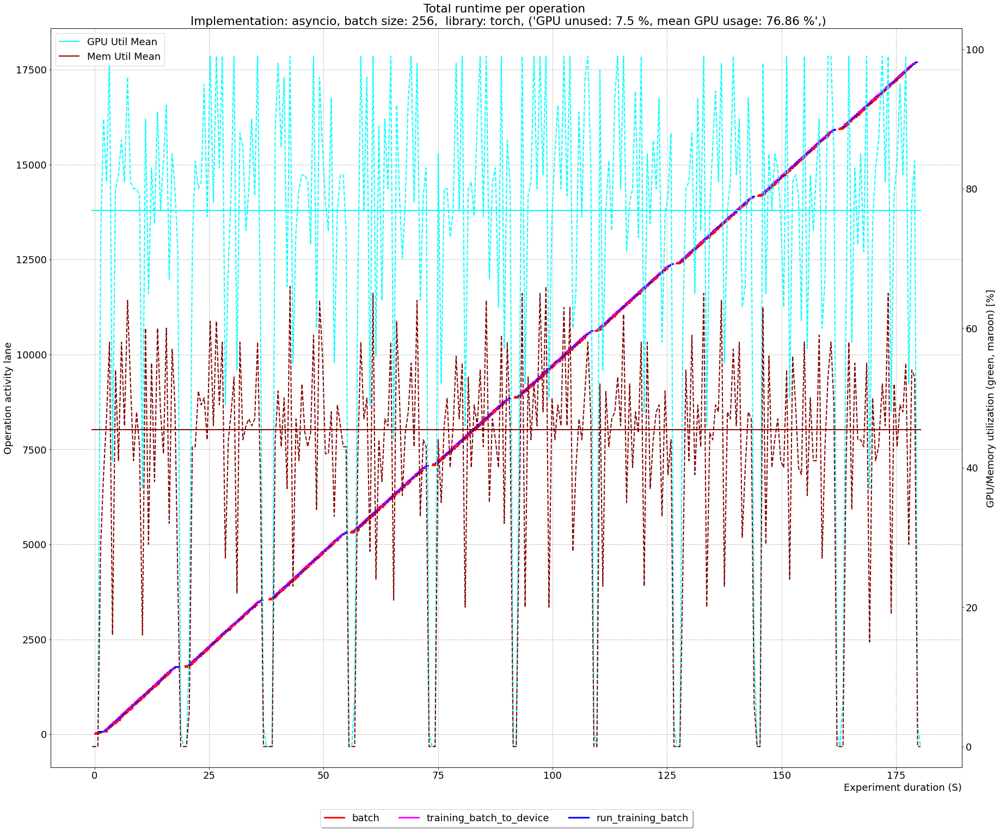

timestamp False
69.24871794871795 24.277628032345014


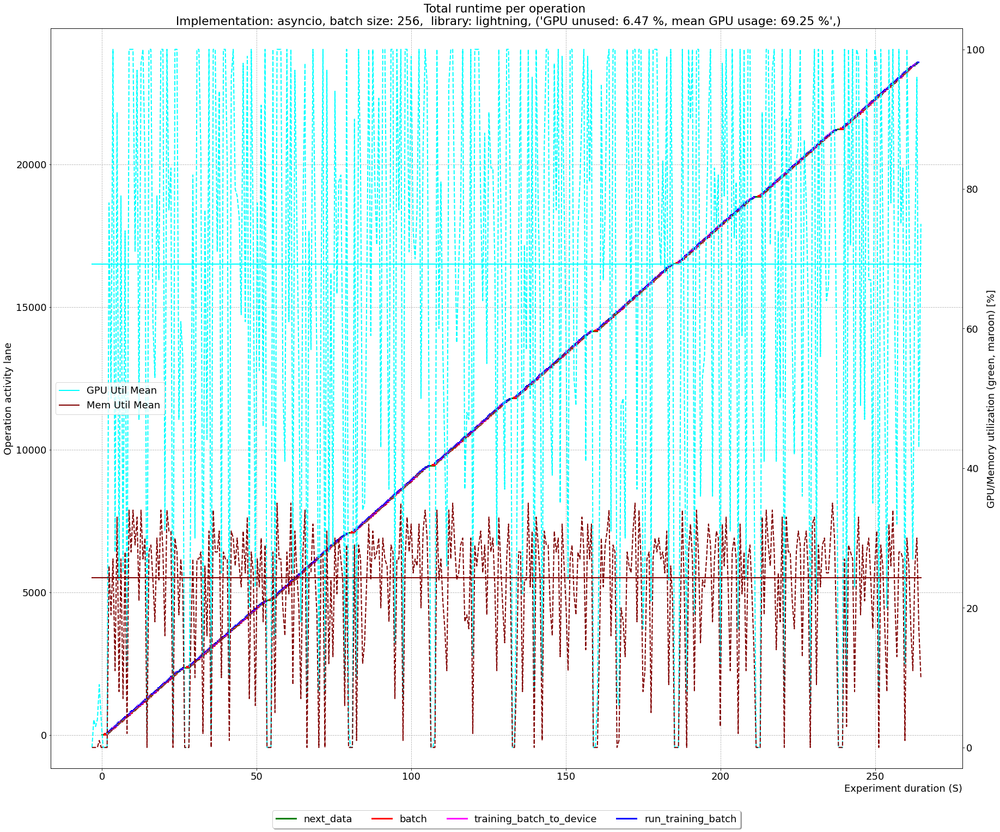

timestamp False
69.41353383458646 39.26377952755905


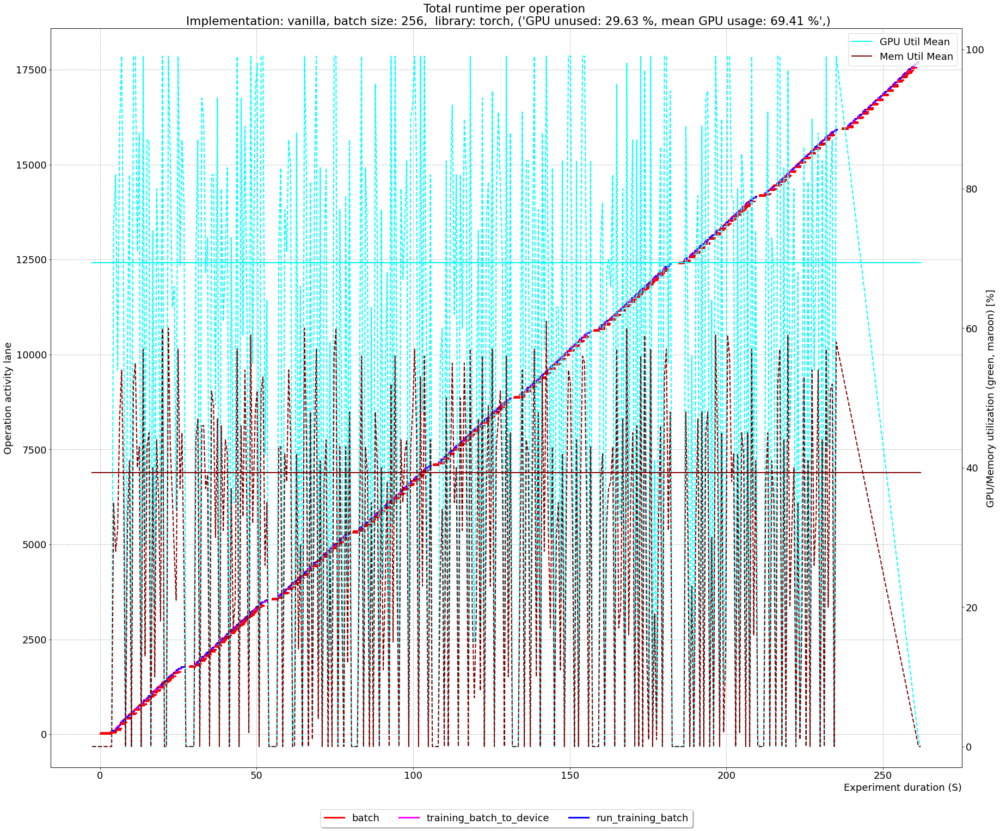

timestamp False
56.72808988764045 22.557951482479783


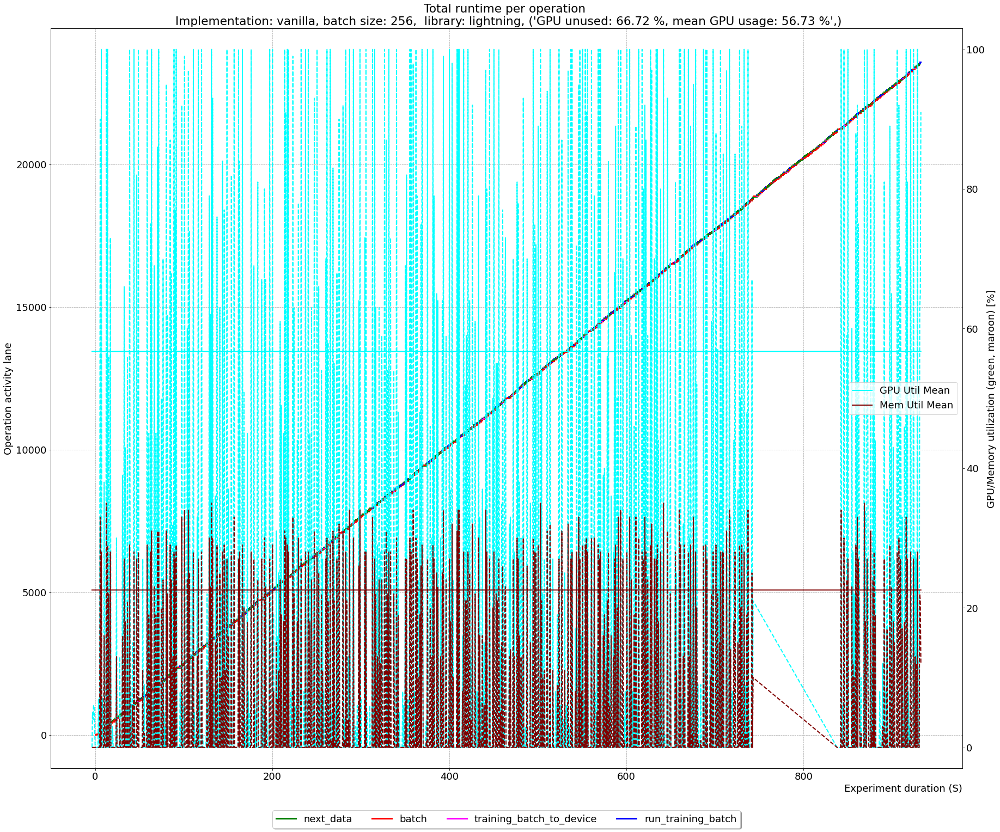

In [9]:
returns_scratch = []
for run in sorted(unique_runs_scratch):
    df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
    dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
    df = df.drop_duplicates(subset="id", keep="first", inplace=False)
    result = show_timelines_with_gpu(df, dfgpu, lanes, colors, run, False, True, False, 2)
    result["run"]=run
    returns_scratch.append(result)

### Result tables

The following two tables display throughput details for both experiments. The default sample size, i.e. number of dataset items is 15000.

In [10]:
# sanity check
get_metadata_info(output_base_folder / "1711-long/s3" / unique_runs_s3[0])

Dataset:  15000
Batch size: 256
Epochs:  10
Images total:  150000
Batches per epoch 59
Images total (rounded):  151040


(15000, 256, 10, 150000, 59, 151040)

#### AWS S3

In [11]:
df_full_s3 = extract_pandas(output_base_folder, folder_filter=s3_folder_filter)
results_s3 = pd.DataFrame.from_records(data=returns_s3)
r = get_throughput(results_s3, "1711-long/s3", df_full_s3, unique_runs_s3, output_base_folder)
r.round(2)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 216/216 [00:18<00:00, 11.89it/s]


,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,throughput,dl_MB,imgs,Mbit/s,MB/s
0,576.66,62.63,61.15,12.74,37.05,threaded,1,torch,260.12,12814.42,150000,177.77,22.22
1,556.82,49.66,60.66,10.21,23.56,threaded,1,lightning,269.38,12814.42,150000,184.11,23.01
2,577.84,63.50,62.53,12.95,38.80,asyncio,1,torch,259.59,16929.26,150000,234.38,29.30
3,563.38,47.40,61.25,10.79,22.88,asyncio,1,lightning,266.25,16929.26,150000,240.40,30.05
4,4130.36,95.23,68.06,1.79,40.52,vanilla,1,torch,36.32,16929.26,150000,32.79,4.10
5,16710.24,98.16,56.62,0.35,22.41,vanilla,1,lightning,8.98,16929.26,150000,8.10,1.01


#### Scratch

In [12]:
df_full_scratch = extract_pandas(output_base_folder, folder_filter=scratch_folder_filter)
results_scratch = pd.DataFrame.from_records(data=returns_scratch)
r = get_throughput(results_scratch, "1711-long/scratch", df_full_scratch, unique_runs_scratch, output_base_folder)
r.round(2)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 216/216 [00:18<00:00, 11.74it/s]


,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,throughput,dl_MB,imgs,Mbit/s,MB/s
0,176.99,8.66,78.99,42.59,47.19,threaded,1,torch,847.51,19417.48,150000,877.68,109.71
1,261.83,8.57,71.07,22.00,25.59,threaded,1,lightning,572.90,19417.48,150000,593.29,74.16
2,179.34,7.50,76.86,40.59,45.46,asyncio,1,torch,836.38,16913.54,150000,754.46,94.31
3,263.89,6.47,69.25,21.60,24.28,asyncio,1,lightning,568.42,16913.54,150000,512.74,64.09
4,261.22,29.63,69.41,26.38,39.26,vanilla,1,torch,574.24,16913.54,150000,517.99,64.75
5,931.86,66.72,56.73,6.26,22.56,vanilla,1,lightning,160.97,16913.54,150000,145.20,18.15
